# Análise de acidentes registrados em rodovias federais no ano de 2022

Neste documento, vamos analisar os dados de **registros de acidentes ocorridos em rodovias federais no ano de 2022** até o presente momento.

<img src="https://img.shields.io/badge/Python-3.10.0%2B-orange" alt="drawing" width="80"/>

[![](https://img.shields.io/badge/Apache-License-green)](https://github.com/rgizsilva/Analise-de-dados-acidentes-rodoviarios/blob/main/LICENSE)

[![](https://img.shields.io/badge/Linkedin-Reginaldo-blue )](https://www.linkedin.com/in/rgiz/)


<img src="https://raw.githubusercontent.com/rgizsilva/Analise-de-dados-acidentes-rodoviarios/main/Analise_acidente_imagem.jpeg" alt="drawing" width="850"/>


Estima-se que no Brasil ocorram **45 mil mortes** anualmente em decorrência de acidentes no trânsito. E, além de vidas, o prejuízo também é econômico, cerca de **R$ 50bi** de prejuízo para os cofres públicos a cada ano. Para se ter uma ideia da gravidade, em **2017** esses acidentes foram a principal causa de morte de **crianças** entre **5** a **14** anos. É por isso que medidas vêm sendo tomadas ao longo dos anos para diminuir os dados negativos ao país. 
Neste documento abordaremos alguns *insights* para trabalhar na **prevenção** de acidentes em rodovias federais. Faremos um levantamento e mapeamento de todas as ocorrências de acidentes nas rodovias em 2022, de modo que possamos identificar alguns fatores de risco e fazer uma abordagem mais direta nos trechos e situações em que os acidentes mais ocorrem.

---

## Obtenção dos dados

O conjunto de dados usado nesse projeto foi obetido pelo site [Gov.br](https://www.gov.br/) e se encontra para download em [dados abertos acidentes](https://www.gov.br/prf/pt-br/acesso-a-informacao/dados-abertos/dados-abertos-acidentes) forncedidos pela **Polícia Rodoviária Federal**

O *dataset* contém **42070** ocorrências registradas, com **30** colunas de atributos para cada ocorrência.

---

## Informações sobre os atributos:

* <kbd>id</kbd> *- número identificador*
* <kbd>data_inversa</kbd> *- data da ocorrência*
* <kbd>dia_semana</kbd> *- dia da semana da ocorrência*
    - segunda-feira
    - terça-feira
    - quarta-feira
    - quinta-feira
    - sexta-feira
    - sabado
    - domingo
* <kbd>horario</kbd> *- horário registroda ocorrência na delegacia
* <kbd>uf</kbd> *- estado onde ocorreu o acidente*
* <kbd>br</kbd> *- nome(número) da rodovia federal*
* <kbd>km</kbd> *- local da rodovia*
* <kbd>municipio</kbd> *- município da ocorrência*
* <kbd>causa_acidente</kbd> *- causa do acidente*
* <kbd>tipo_acidente</kbd> *- tipo de acidente*
* <kbd>classificacao_acidente</kbd> *- com ou sem vítimas*
* <kbd>fase_dia</kbd> *- período do dia*
* <kbd>sentido_via</kbd> *- crescente ou decrescente*
* <kbd>condicao_metereologica</kbd> *- condição metereológica*
* <kbd>tipo_pista</kbd> *- tipo da pista*
    - simples
    - dupla
    - múltipla
* <kbd>tracado_via</kbd> *- traçado da rodovia*
* <kbd>uso_solo</kbd> *- se o veiculo saiu da pista*
    - sim
    - não
* <kbd>pessoas</kbd> *- quantas pessoas envolvidas no acidente*
* <kbd>mortos</kbd> *- quantidade de vítimas fatais*
* <kbd>feridos_leves</kbd> *- quantidade de feridos leves*
* <kbd>feridos_graves</kbd> *- quantidade de feridos graves*
* <kbd>ilesos</kbd> *- quantidade de ilesos*
* <kbd>ignorados</kbd> *- sem ferimento*
* <kbd>feridos</kbd> *- quantidade de feridos no geral*
* <kbd>veiculos</kbd> *- quantidade de veículos envolvido*
* <kbd>latitude</kbd> *- latitude do local do acidente*
* <kbd>longitude</kbd> *- longitude do local do acidente*
* <kbd>regional</kbd> *- região da delegacia que efetuou o registro da ocorrência*
* <kbd>delegacia</kbd> *- número/nome da delegacia que registrou a ocorrência*
* <kbd>uop</kbd> *- local destinado prioritariamente à fiscalização rotineira de trânsito*





---


## Importação dos dados e bibliotecas 


Em uma etapa inicial, importaremos os *dados* mencionados e algumas *bibliotecas* do Pyhton para fazer as análises.

In [1]:
# importando as bibliotecas necessárias
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium
from folium import plugins
import requests
from branca.element import Figure
import bar_chart_race as bcr
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

# importando os dados para uma variável 
dados_acidente = 'https://raw.githubusercontent.com/rgizsilva/Analise-de-dados-acidentes-rodoviarios/main/datatran2022.csv'
dados_2012 = 'https://raw.githubusercontent.com/rgiz001/dados_acidentes/main/teste2012_2.csv'
dados_2013 = 'https://raw.githubusercontent.com/rgiz001/dados_acidentes/main/teste2013.csv'
dados_2014 = 'https://raw.githubusercontent.com/rgiz001/dados_acidentes/main/teste14.csv'
dados_2015= 'https://raw.githubusercontent.com/rgiz001/dados_acidentes/main/teste2015.csv'
dados_2016= 'https://raw.githubusercontent.com/rgiz001/dados_acidentes/main/teste2016_2.csv'
dados_2017= 'https://raw.githubusercontent.com/rgiz001/dados_acidentes/main/teste17.csv'
dados_2018='https://raw.githubusercontent.com/rgiz001/dados_acidentes/main/teste18.csv'
dados_2019= 'https://raw.githubusercontent.com/rgiz001/dados_acidentes/main/teste19.csv'
dados_2020='https://raw.githubusercontent.com/rgiz001/dados_acidentes/main/teste20_2.csv'
dados_2021='https://raw.githubusercontent.com/rgiz001/dados_acidentes/main/teste21.csv'
#definindo uma variavel para leitura dos dados
df = pd.read_csv(dados_acidente, encoding="ISO-8859-1", sep=';' )
df2= pd.read_csv(dados_2012,encoding="ISO-8859-1", sep=';' )
df3= pd.read_csv(dados_2013,encoding="ISO-8859-1", sep=';' )
df4= pd.read_csv(dados_2014,encoding="ISO-8859-1", sep=';' )
df5=pd.read_csv(dados_2015,encoding="ISO-8859-1", sep=';' )
df6=pd.read_csv(dados_2016,encoding="ISO-8859-1", sep=';' )
df7=pd.read_csv(dados_2017,encoding="ISO-8859-1", sep=';' )
df8=pd.read_csv(dados_2018,encoding="ISO-8859-1", sep=';' )
df9=pd.read_csv(dados_2019,encoding="ISO-8859-1", sep=';' )
df10=pd.read_csv(dados_2020,encoding="ISO-8859-1", sep=';' )
df11=pd.read_csv(dados_2021,encoding="ISO-8859-1", sep=';' )

----

## Criação de algumas funções que serão usadas no processo de análise dos dados 

In [2]:
#função para plotar dados no grafico
def autolabel(dados):
       for i in plot.patches:
            plot.annotate(i.get_height(),
                         (i.get_x()+i.get_width()/2,i.get_height()),
                         ha='center',va='baseline',fontsize=12,
                         color='black',xytext=(4,0),
                         textcoords='offset points')
#função para plotar dados no grafico
def autolabel2(dados):
    for bar in ax.patches:
        ax.annotate(text = bar.get_height(),
                      xy = (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                      ha='center', 
                      va='center',
                      size=15,
                      xytext=(0, 8),
                      textcoords='offset points')

## Análise Inicial dos dados

Nessa fase, vamos processar os dados para obter algumas informações inciais sobre eles, verificar quantidade de entradas, tipos de entradas, checar a falta de dados e definir quais os atributos vamos separar para fazer nossas análises

In [3]:
# quantos registros e atributos no dataframe:
print("Registros, atributos : ", df.shape)

Registros, atributos :  (42070, 30)


In [4]:
# Conferir os 5 primeiros registros do dataframe:
pd.set_option('display.max_columns',30)
df.head()

,id,data_inversa,dia_semana,horario,uf,br,km,municipio,causa_acidente,tipo_acidente,classificacao_acidente,fase_dia,sentido_via,condicao_metereologica,tipo_pista,tracado_via,uso_solo,pessoas,mortos,feridos_leves,feridos_graves,ilesos,ignorados,feridos,veiculos,latitude,longitude,regional,delegacia,uop
0,405151,2022-01-01,sábado,01:35:00,PI,316.0,415,MARCOLANDIA,Ingestão de álcool pelo condutor,Colisão traseira,Com Vítimas Feridas,Plena Noite,Decrescente,Nublado,Simples,Reta,Sim,2,0,1,0,1,0,1,2,"-7,43280012",-40.682619,SPRF-PI,DEL04-PI,UOP03-DEL04-PI
1,405158,2022-01-01,sábado,02:40:00,PR,116.0,33,CAMPINA GRANDE DO SUL,Ingestão de álcool pelo condutor,Tombamento,Com Vítimas Fatais,Pleno dia,Decrescente,Nublado,Dupla,Curva,Não,2,1,1,0,0,0,1,1,"-25,114403",-48.846755,SPRF-PR,DEL01-PR,UOP02-DEL01-PR
2,405172,2022-01-01,sábado,05:22:00,MS,163.0,393,NOVA ALVORADA DO SUL,Condutor deixou de manter distância do veículo...,Colisão traseira,Com Vítimas Feridas,Amanhecer,Decrescente,Céu Claro,Simples,Não Informado,Não,2,0,1,0,1,0,1,2,"-21,228445",-54.456296,SPRF-MS,DEL02-MS,UOP01-DEL02-MS
3,405203,2022-01-01,sábado,07:00:00,RJ,101.0,457,ANGRA DOS REIS,Reação tardia ou ineficiente do condutor,Colisão frontal,Com Vítimas Feridas,Pleno dia,Decrescente,Chuva,Simples,Curva,Sim,2,0,0,1,1,0,1,2,"-23,03149804",-44.177153,SPRF-RJ,DEL03-RJ,UOP02-DEL03-RJ
4,405207,2022-01-01,sábado,09:00:00,MG,40.0,"508,3",RIBEIRAO DAS NEVES,Acumulo de água sobre o pavimento,Saída de leito carroçável,Sem Vítimas,Pleno dia,Decrescente,Chuva,Dupla,Reta,Sim,3,0,0,0,3,0,0,1,"-19,76061249",-44.134754,SPRF-MG,DEL02-MG,UOP01-DEL02-MG


In [5]:
#Substituindo no nosso dataframe a vírgula por ponto para poder fazer uma converção.
df.latitude = df['latitude'].replace(',', '.', regex=True).astype(float)


In [6]:
df['tipo_acidente'].value_counts()

Colisão traseira                  7870
Saída de leito carroçável         6759
Colisão transversal               5274
Colisão lateral mesmo sentido     4017
Tombamento                        3601
Colisão com objeto                3103
Colisão frontal                   2891
Atropelamento de Pedestre         1991
Queda de ocupante de veículo      1837
Colisão lateral sentido oposto    1160
Capotamento                        992
Incêndio                           872
Atropelamento de Animal            730
Engavetamento                      661
Eventos atípicos                   216
Derramamento de carga               96
Name: tipo_acidente, dtype: int64

Agora, vamos definir quais variáveis de atributos vamos trabalhar. Vamos eliminar algumas colunas para dar segmento a nossa análise.

In [7]:
df.drop('id',axis=1,inplace=True)
df.drop('sentido_via',axis=1,inplace=True)
df.drop('tracado_via',axis=1,inplace=True)
df.drop('uso_solo',axis=1,inplace=True)
df.drop('feridos_leves',axis=1,inplace=True)
df.drop('ignorados',axis=1,inplace=True)
df.drop('regional',axis=1,inplace=True)
df.drop('delegacia',axis=1,inplace=True)
df.drop('uop',axis=1,inplace=True)


Vamos conferir quantos valores de registros estão faltando no nosso conjunto de dados:

In [8]:
#checar os dados nulos 
df.isnull().sum().sort_values(ascending= False)


br                        138
km                        138
data_inversa                0
tipo_pista                  0
latitude                    0
veiculos                    0
feridos                     0
ilesos                      0
feridos_graves              0
mortos                      0
pessoas                     0
fase_dia                    0
condicao_metereologica      0
dia_semana                  0
classificacao_acidente      0
tipo_acidente               0
causa_acidente              0
municipio                   0
uf                          0
horario                     0
longitude                   0
dtype: int64

Podemos perceber que estão faltando **138** valores nos atributos *km* e *br*

Isso representa **0.3%** dos nossos dados.

Para sequência da nossa análise, **não faremos** a remoção dos dados faltantes, pois como se trata de uma *ocorrência policial registrada em documento*, precisamos dos demais dados dessa ocorrência para fazer uma análise *fidedigna* ao que já foi documentado.

----


## Início das análises

Vamos ver um gráfico onde mostra a **frequência de acidentes** em cada dia da semana :

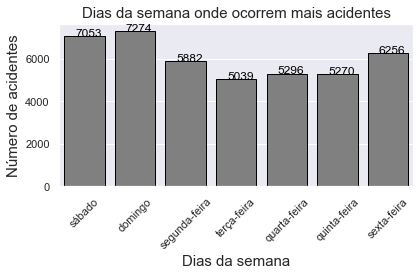

In [9]:
#criando gráfico com a biblioteca matplotlib e seaborn
sns.set()
plot = sns.countplot(x = df['dia_semana'],color='gray',edgecolor='black')
autolabel(plot)
plt.xticks(rotation = 45)
plt.title("Dias da semana onde ocorrem mais acidentes",fontsize=15)
plt.xlabel('Dias da semana',fontsize=15)
plt.ylabel('Número de acidentes',fontsize=15)
plt.tight_layout()


Podemos perceber que **domingo** é o dia onde ocorre **mais acidentes** pelo país, seguido de **sábado**. **Terça-feira** é o dia que ocorre **menos acidentes**, seguido de **quinta-feira**

Podemos analisar agora, em quais **períodos do dia** acontece mais acidentes

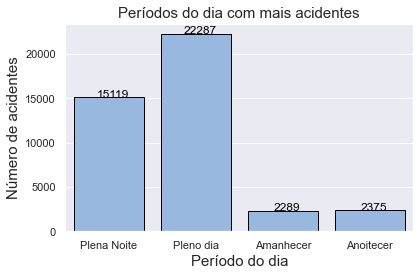

In [10]:
#criando gráfico com a biblioteca matplotlib e seaborn
plot = sns.countplot(x = df['fase_dia'],color='#8db7eb',edgecolor='black')
autolabel(plot)
plt.title("Períodos do dia com mais acidentes",fontsize=15)
plt.xlabel('Período do dia',fontsize=15)
plt.ylabel('Número de acidentes',fontsize=15)
plt.tight_layout()


O gráfico nos mostra que a **maioria dos acidentes**  acontece **durante o dia**. Vamos ver em qual **horário** os acidentes são mais *frequentes* :

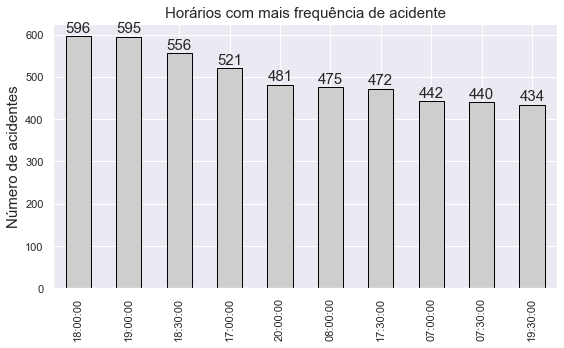

In [11]:
#criando gráfico com a biblioteca matplotlib e seaborn
df_horario = df.horario.value_counts().head(10)
fig,ax = plt.subplots(figsize=(8,5))
plt.title("Horários com mais frequência de acidente",fontsize=15)
plt.ylabel('Número de acidentes',fontsize=15)
plot = df_horario.plot.bar(color='#CFCDCE',edgecolor='black')
autolabel2(plot)
plt.tight_layout();

Apesar do gráfico anterior nos mostrar que a maioria dos acidentes acontece durante o dia, esse nos mostra que o horário com mais frequência é as  **18h** seguido de **19h** e **18h30min**


Veremos  em quais **condições climáticas** acontecem mais acidentes:

In [12]:
#utilizando a bilbioteca pandas para fazer consultas
df['condicao_metereologica'].value_counts().head(10)/df.condicao_metereologica.shape[0]

Céu Claro           0.621464
Nublado             0.155503
Chuva               0.099762
Sol                 0.062776
Garoa/Chuvisco      0.034134
Ignorado            0.013454
Nevoeiro/Neblina    0.010982
Vento               0.001878
Granizo             0.000024
Neve                0.000024
Name: condicao_metereologica, dtype: float64

Temos **céu claro** com **62%** da *condição meteorológica dos acidentes*, seguido de **nublado** com **15%** e **chuva** com **0.9%**

Veremos agora, qual o horário com maior número de **feridos** e **mortos**:

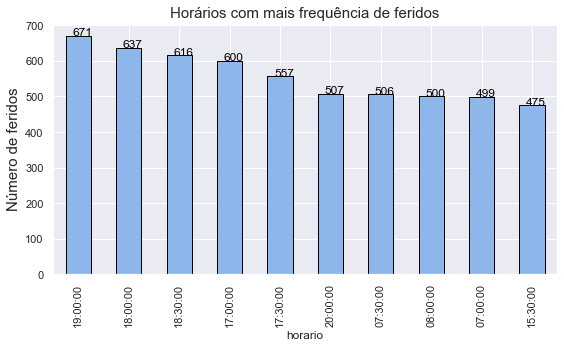

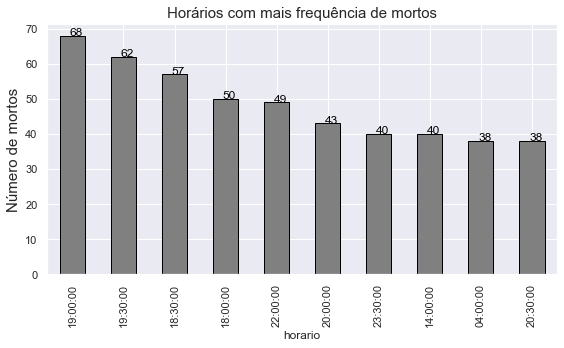

In [13]:
#horário com mais frequência de feridos
df_feridos = df.groupby(['horario']).feridos.sum().sort_values(ascending=False).head(10)
fig,ax = plt.subplots(figsize=(8,5))
plt.title("Horários com mais frequência de feridos",fontsize=15)
plt.ylabel('Número de feridos',fontsize=15)
plot = df_feridos.plot.bar(color='#8db7eb',edgecolor='black')
autolabel(plot)
plt.tight_layout();

#horário com mais frequência de mortos
df_feridos = df.groupby(['horario']).mortos.sum().sort_values(ascending=False).head(10)
fig,ax = plt.subplots(figsize=(8,5))
plt.title("Horários com mais frequência de mortos",fontsize=15)
plt.ylabel('Número de mortos',fontsize=15)
plot = df_feridos.plot.bar(color='gray',edgecolor='black')
autolabel(plot)
plt.tight_layout();

Apesar de os registros de acidentes serem mais frequentes durante o dia, podemos perceber que os acidentes mais graves com feridos e mortos acontecem com mais frequência após as **18h**

---

Veremos agora quais são as maiores **causas** dos acidentes registrados


Quantidade das causas de acidente :


Reação tardia ou ineficiente do condutor                     5375
Ausência de reação do condutor                               4733
Acessar a via sem observar a presença dos outros veículos    3637
Velocidade Incompatível                                      3299
Ingestão de álcool pelo condutor                             2875
Name: causa_acidente, dtype: int64

Porcentagem das causas de acidente :


Reação tardia ou ineficiente do condutor                     0.127763
Ausência de reação do condutor                               0.112503
Acessar a via sem observar a presença dos outros veículos    0.086451
Velocidade Incompatível                                      0.078417
Ingestão de álcool pelo condutor                             0.068338
Name: causa_acidente, dtype: float64

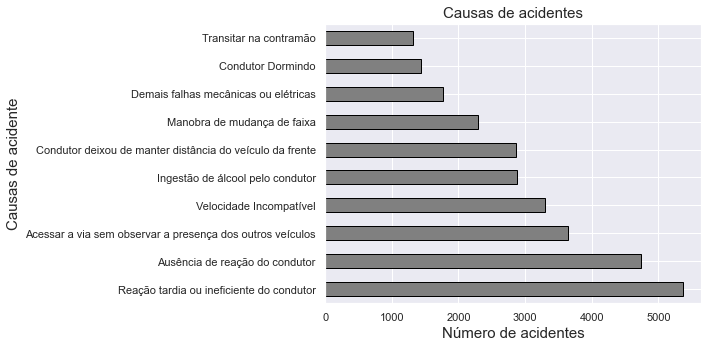

In [14]:
#criando gráfico com a biblioteca matplotlib e seaborn 
fig,ax = plt.subplots(figsize=(10,5))
df_causa = df['causa_acidente'].value_counts().head(10)
plt.title("Causas de acidentes",fontsize=15)
plt.xlabel('Número de acidentes',fontsize=15)
plt.ylabel('Causas de acidente',fontsize=15)
print('\033[1m' + 'Quantidade das causas de acidente :' + '\033[0m')
display(df_causa.head(5))
plot = df_causa.plot.barh(color='grey',edgecolor='black')
plt.tight_layout();
print('\033[1m' + 'Porcentagem das causas de acidente :' + '\033[0m')
df.causa_acidente.value_counts().head(5)/df.shape[0]


Quantidade dos tipos de acidente :


Colisão traseira                 7870
Saída de leito carroçável        6759
Colisão transversal              5274
Colisão lateral mesmo sentido    4017
Tombamento                       3601
Name: tipo_acidente, dtype: int64

Porcentagem dos tipos de acidente :


Colisão traseira                 0.187069
Saída de leito carroçável        0.160661
Colisão transversal              0.125362
Colisão lateral mesmo sentido    0.095484
Tombamento                       0.085595
Name: tipo_acidente, dtype: float64

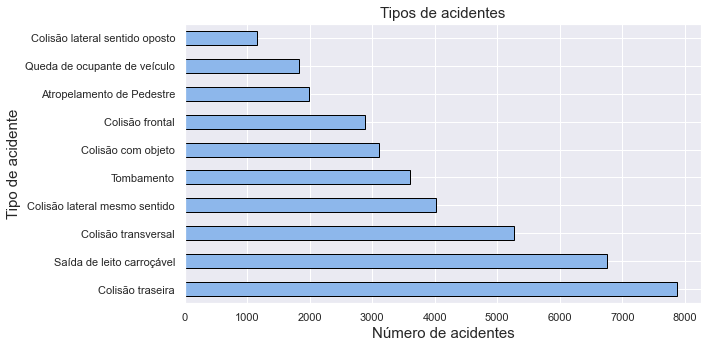

In [15]:
#criando gráfico com a biblioteca matplotlib e seaborn
df_tipo = df.tipo_acidente.value_counts().head(10)
sns.set()
fig,ax = plt.subplots(figsize=(10,5))
plt.title("Tipos de acidentes",fontsize=15)
plt.xlabel('Número de acidentes',fontsize=15)
plt.ylabel('Tipo de acidente',fontsize=15)
print('\033[1m' + 'Quantidade dos tipos de acidente :' + '\033[0m')
display(df_tipo.head(5))
df_tipo.plot.barh(color='#8db7eb',edgecolor='black')
plt.tight_layout();
print('\033[1m' + 'Porcentagem dos tipos de acidente :' + '\033[0m')
df.tipo_acidente.value_counts().head(5)/df.shape[0]

* Reação tardia ou ineficiente do condutor **- 12%**
* Ausência de reação do condutor **- 11%**
* Acessar a via sem observar a presença dos outros veículos **- 8%**
* Velocidade Incompatível **- 7%**
* Ingestão de álcool pelo condutor **- 6%**
----
* Colisão traseira **- 18%**
* Saída de leito carroçável **- 16%**
* CColisão transversal **- 12%**
* Colisão lateral mesmo sentido **- 9%**
* Tombamento **- 8%**

Como estão distribuídos os números desses acidentados entre **ilesos**, **feridos** e **mortos**:

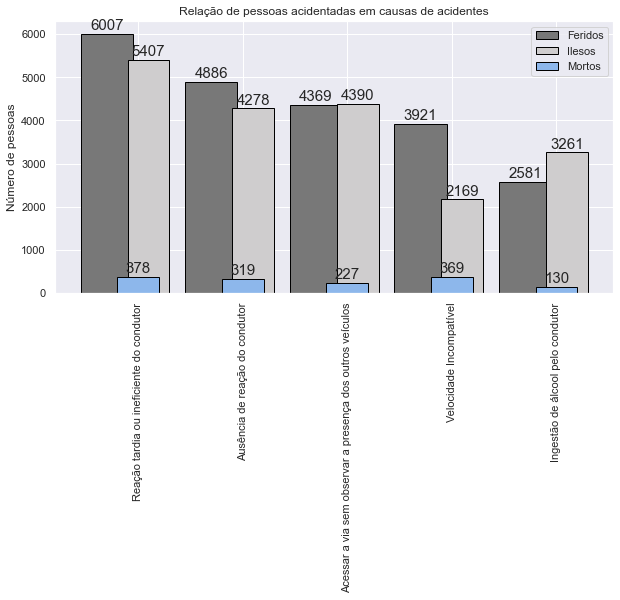

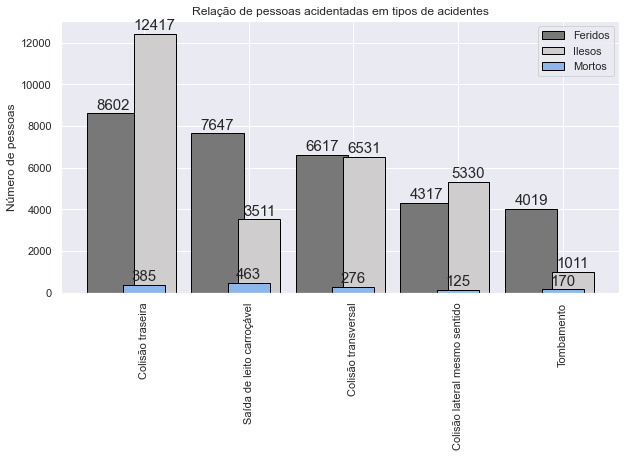

In [16]:
#relação de pessoas acidentadas em causas de acidentes
dados = ['Reação tardia ou ineficiente do condutor','Ausência de reação do condutor','Acessar a via sem observar a presença dos outros veículos',
         'Velocidade Incompatível','Ingestão de álcool pelo condutor']
y = [df.loc[df.causa_acidente == dados[0]].mortos.sum(),df.loc[df.causa_acidente == dados[1]].mortos.sum(),
     df.loc[df.causa_acidente == dados[2]].mortos.sum(),df.loc[df.causa_acidente == dados[3]].mortos.sum(),
     df.loc[df.causa_acidente == dados[4]].mortos.sum()]
y2 = [df.loc[df.causa_acidente == dados[0]].feridos.sum(),df.loc[df.causa_acidente == dados[1]].feridos.sum(),
     df.loc[df.causa_acidente == dados[2]].feridos.sum(),df.loc[df.causa_acidente == dados[3]].feridos.sum(),
     df.loc[df.causa_acidente == dados[4]].feridos.sum()]
y3 = [df.loc[df.causa_acidente == dados[0]].ilesos.sum(),df.loc[df.causa_acidente == dados[1]].ilesos.sum(),
     df.loc[df.causa_acidente == dados[2]].ilesos.sum(),df.loc[df.causa_acidente == dados[3]].ilesos.sum(),
     df.loc[df.causa_acidente == dados[4]].ilesos.sum()]
x = np.arange(len(dados))
fig,ax = plt.subplots(nrows =1,ncols=1,figsize=(10,5))
ax.set_title('Relação de pessoas acidentadas em causas de acidentes')
plt.xticks(x,dados,rotation ='vertical')
plt.ylabel('Número de pessoas')
plot = ax.bar(x-0.3,y2,width=0.5,label='Feridos',color='#787878',edgecolor='black')
plot = ax.bar(x+0.1,y3,width=0.4,label='Ilesos',color='#CFCDCE',edgecolor='black')
plot = ax.bar(x,y,width=0.4,label='Mortos',color='#8db7eb',edgecolor='black')  
autolabel2(plot)
ax.legend();

#relação de pessoas acidentadas em tipos de acidentes
dados = ['Colisão traseira','Saída de leito carroçável','Colisão transversal',
         'Colisão lateral mesmo sentido','Tombamento']
y = [df.loc[df.tipo_acidente == dados[0]].mortos.sum(),df.loc[df.tipo_acidente == dados[1]].mortos.sum(),
     df.loc[df.tipo_acidente == dados[2]].mortos.sum(),df.loc[df.tipo_acidente == dados[3]].mortos.sum(),
     df.loc[df.tipo_acidente == dados[4]].mortos.sum()]
y2 = [df.loc[df.tipo_acidente == dados[0]].feridos.sum(),df.loc[df.tipo_acidente == dados[1]].feridos.sum(),
     df.loc[df.tipo_acidente == dados[2]].feridos.sum(),df.loc[df.tipo_acidente == dados[3]].feridos.sum(),
     df.loc[df.tipo_acidente == dados[4]].feridos.sum()]
y3 = [df.loc[df.tipo_acidente == dados[0]].ilesos.sum(),df.loc[df.tipo_acidente == dados[1]].ilesos.sum(),
     df.loc[df.tipo_acidente == dados[2]].ilesos.sum(),df.loc[df.tipo_acidente == dados[3]].ilesos.sum(),
     df.loc[df.tipo_acidente == dados[4]].ilesos.sum()]
x = np.arange(len(dados))
fig,ax = plt.subplots(nrows =1,ncols=1,figsize=(10,5))
ax.set_title('Relação de pessoas acidentadas em tipos de acidentes')
plt.xticks(x,dados,rotation ='vertical')
plt.ylabel('Número de pessoas')
plot = ax.bar(x-0.3,y2,width=0.5,label='Feridos',color='#787878',edgecolor='black')
plot = ax.bar(x+0.1,y3,width=0.4,label='Ilesos',color='#CFCDCE',edgecolor='black')
plot = ax.bar(x,y,width=0.4,label='Mortos',color='#8db7eb',edgecolor='black')  
autolabel2(plot)
ax.legend();


In [17]:
feridos = df.feridos.sum()
ilesos = df.ilesos.sum()
mortos = df.mortos.sum()
print('\033[1m' + 'pessoas feridas :' + '\033[0m',feridos,'\n','\033[1m' + 'pessoas iledas :' + '\033[0m',ilesos,'\n',
     '\033[1m' + 'pessoas mortas :' + '\033[0m',mortos)


pessoas feridas : 47163 
 pessoas iledas : 42965 
 pessoas mortas : 3546


Levando em consideração a nossa base de dados em número de pessoas **feridas**, **ilesas** e **mortas** temos:

* Reação tardia ou ineficiente do condutor
    - **12.73%** - *feridos*
    - **12.58%** - *ilesoss*
    - **10.65%** -  *mortos*
    
* Ausência de reação do condutor
    - **10.35%** - *feridos*
    - **9.95%** - *ilesos*
    - **8.99%** - *mortos*
    
* Acessar a via sem observar a presença dos outros veículos
    - **9.26%** - *feridos*
    - **10.21%** - *ilesos*
    - **6.40%** - *mortos*
* Velocidade Incompatível 
    - **8.31%** - *feridos*
    - **5.04%** - *ilesos*
    - **10.40%** - *mortos*
* Ingestão de álcool pelo condutor
    - **5.47%** - *feridos*
    - **7.58%** - *ilesos*
    - **3.66%** - *mortos*
----
* Colisão traseira
    - **18.23%** - *feridos*
    - **28.90%** - *ilesos*
    - **10.85%** - *mortos*
* Saída de leito carroçável
    - **16.21%** - *feridos*
    - **8.17%** - *ilesos*
    - **13.05%** - *mortos*
* Colisão transversal
    - **14.03** - *feridos*
    - **15.20%** - *ilesos*
    - **7.78%** - *mortos*
* Colisão lateral mesmo sentido
    - **9.15%** - *feridos*
    - **12.40%** - *ilesos*
    - **3.52%** - *mortos*
* Tombamento
    - **8.52%** - *feridos*
    - **2.35%** - *ilesos*
    - **4.79%** - *mortos*


Quais são as causas e tipos de acidentes com mais **vítimas fatais**:

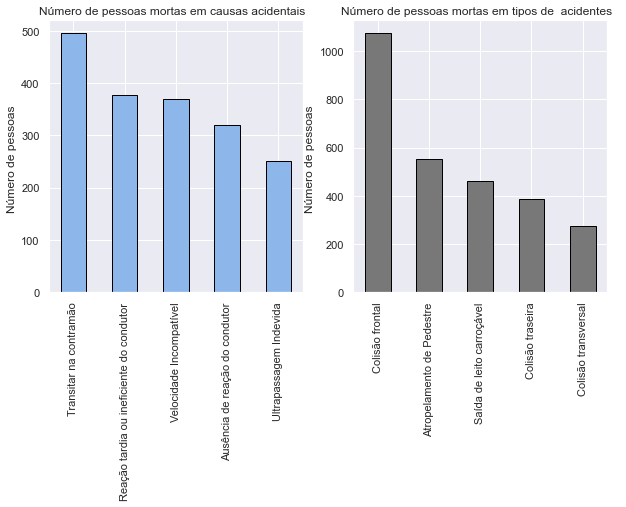

Número de pessoas mortas em causas acidentais :


causa_acidente
Transitar na contramão                      495
Reação tardia ou ineficiente do condutor    378
Velocidade Incompatível                     369
Ausência de reação do condutor              319
Ultrapassagem Indevida                      252
Name: mortos, dtype: int64

Número de pessoas mortas em tipos de acidentes :


tipo_acidente
Colisão frontal              1073
Atropelamento de Pedestre     551
Saída de leito carroçável     463
Colisão traseira              385
Colisão transversal           276
Name: mortos, dtype: int64

In [18]:
#definindo as variáveis
fig,ax = plt.subplots(nrows =1,ncols=2,figsize=(10,5))
ocorrencia = [dict(df.groupby(['causa_acidente']).mortos.sum().sort_values(ascending=False).head(5)),dict(df.groupby(['tipo_acidente']).mortos.sum().sort_values(ascending=False).head(5))]
x = [ocorrencia[0].keys(),ocorrencia[1].keys()]
y = [ocorrencia[0].values(),ocorrencia[1].values()]
xpos = np.arange(len(x[0]))
xpos2 = np.arange(len(x[1]))

#plotando grafico 1 
plot9 = ax[0].bar(x[0],y[0],width=0.5,label='Feridos',color='#8db7eb',edgecolor='black')
ax[0].set_title('Número de pessoas mortas em causas acidentais  ')
ax[0].set_ylabel('Número de pessoas ')
ax[0].set_xticks(xpos,x[0],rotation ='vertical')

#plotando grafico 1 
plot8 = ax[1].bar(x[1],y[1],width=0.5,label='Feridos',color='#787878',edgecolor='black')
ax[1].set_title('Número de pessoas mortas em tipos de  acidentes  ')
ax[1].set_ylabel('Número de pessoas ')
ax[1].set_xticks(xpos,x[1],rotation ='vertical')
plt.show();
causa=df.groupby(['causa_acidente']).mortos.sum().sort_values(ascending=False).head(5)
tipo=df.groupby(['tipo_acidente']).mortos.sum().sort_values(ascending=False).head(5)
print('\033[1m' + 'Número de pessoas mortas em causas acidentais :' + '\033[0m')
display(causa)
print('\033[1m' + 'Número de pessoas mortas em tipos de acidentes :' + '\033[0m')
display(tipo)


**Transitar na contramão** e **colisão frontal**, são as causas e os tipos de acidentes mais fatais registrados, eles representam :

* Transitar na contramão 
    - **13.95%** - *dos registros de pessoas mortas*
    
* Colisão frontal 
    - **30.25%** - *dos registros de pessoas mortas*
    
Seguidos de **Reação tardia ou ineficiente do condutor** com **10.65%** e **Atropelamento de Pedestre** com **15.53%** do número de mortos registrados


Qual o **tipo de pista** com mais **acidentes registrados**

In [19]:
pista_acidentes = df.tipo_pista.value_counts()/df.tipo_pista.shape[0]
pista_mortos = df.groupby(['tipo_pista']).mortos.sum().sort_values(ascending=False)/df.mortos.sum()
print(pista_acidentes,'\n')
print(pista_mortos)


Simples     0.496102
Dupla       0.414571
Múltipla    0.089327
Name: tipo_pista, dtype: float64 

tipo_pista
Simples     0.709250
Dupla       0.249295
Múltipla    0.041455
Name: mortos, dtype: float64


**Pista simples** representa **49%** dos acidentes registrados, sendo **70%** das vítimas fatais, enquanto **pista dupla** representa **41%** dos acidentes sendo **24%** das vítimas fatais.

Veremos a seguir, quais são os **municípios**, **estados** e **rodovias** com **maior número de acidentes** *registrados*:

In [20]:
municipio = df.municipio.value_counts().head(10)
municipiopor = df.municipio.value_counts().head(3)/df.municipio.shape[0]
estado = df.uf.value_counts().head(10)
estadopor = df.uf.value_counts().head(3)/df.uf.shape[0]
rodovia = df.br.value_counts().head(10)
rodoviapor = df.br.value_counts().head(3)/df.br.shape[0]

print('\033[1m' + 'Os municípios com maior número de acidentes são :' + '\033[0m','\n\n',municipio,'\n\n','As porcentagens são','\n\n',municipiopor,'\n')
print('\033[1m' + 'Os estados com maior número de acidentes são :' + '\033[0m','\n\n',estado,'\n\n','As porcentagens são','\n\n',estadopor,'\n')
print('\033[1m' + 'As rodovias com maior número de acidentes são :' + '\033[0m','\n\n',rodovia,'\n\n','As porcentagens são','\n\n',rodoviapor,'\n')

Os municípios com maior número de acidentes são : 

 BRASILIA                605
CURITIBA                597
GUARULHOS               497
SAO JOSE                467
DUQUE DE CAXIAS         396
BETIM                   373
PALHOCA                 320
SERRA                   295
SAO JOSE DOS PINHAIS    265
PORTO VELHO             264
Name: municipio, dtype: int64 

 As porcentagens são 

 BRASILIA     0.014381
CURITIBA     0.014191
GUARULHOS    0.011814
Name: municipio, dtype: float64 

Os estados com maior número de acidentes são : 

 MG    5288
SC    5007
PR    4870
RS    3269
RJ    2958
SP    2824
BA    2213
GO    2058
PE    1725
ES    1572
Name: uf, dtype: int64 

 As porcentagens são 

 MG    0.125695
SC    0.119016
PR    0.115759
Name: uf, dtype: float64 

As rodovias com maior número de acidentes são : 

 101.0    6993
116.0    6340
40.0     1957
381.0    1950
153.0    1629
163.0    1424
364.0    1346
277.0    1249
376.0    1131
262.0    1025
Name: br, dtype: int64 

 As porcentage

Com isso temos, **Brasília** como a cidade onde ocorrem mais acidentes, com **0.14%**, **Minas Gerais** como estado onde ocorrem mais acidentes com **12%** e a **BR 101** como a rodovia com maior ocorrência de acidentes

Agora veremos os dados de forma **geográficos**, concentrando mais as nossas *análises* no **local exato** dos acidentes
Para o primeiro mapa,temos as **condições metereológicas** dos acidentes.
+ *ícone laranja* - **Acidente com sol**
+ *ícone azul* - **Acidente com chuva**
+ *ícone azul claro* - **Acidente com céu claro**
+ *ícone cinza* - **Acidente céu nublado**
    

In [21]:
# Criando uma função que vai receber o nome de um município e sua localização geográfica
def mapa(municipio,lati,long):
    
    filtro = df.loc[(df.municipio == (municipio)) & (df.condicao_metereologica == 'Chuva')]
    latitude = filtro.latitude.value_counts().sort_values(ascending=False).head(10).keys()
    longitude = filtro.longitude.value_counts().sort_values(ascending=False).head(10).keys()
    figMapa = Figure(width=950,height=600)
    mapa = folium.Map(location=[lati,long], zoom_start =12)
    figMapa.add_child(mapa)
    for lat,lon in zip(latitude,longitude):
        folium.Marker(location=[lat,lon],popup='Acidente com chuva',
                     icon=folium.Icon(color='blue',
                                     icon = 'glyphicon glyphicon-tint',
                                      icon_color= 'white',
                                      prefix = 'glyphicon')).add_to(mapa)
    filtro = df.loc[(df.municipio == (municipio)) & (df.condicao_metereologica == 'Sol')]
    latitude = filtro.latitude.value_counts().sort_values(ascending=False).head(10).keys()
    longitude = filtro.longitude.value_counts().sort_values(ascending=False).head(10).keys()
    for lat,lon in zip(latitude,longitude):
        folium.Marker(location=[lat,lon],popup='Acidente com sol',
                     icon=folium.Icon(color='orange',
                                     icon = 'glyphicon glyphicon-certificate',
                                      icon_color= 'white',
                                      prefix = 'glyphicon')).add_to(mapa)
    filtro = df.loc[(df.municipio == (municipio)) & (df.condicao_metereologica == 'Céu Claro')]
    latitude = filtro.latitude.value_counts().sort_values(ascending=False).head(10).keys()
    longitude = filtro.longitude.value_counts().sort_values(ascending=False).head(10).keys()
    for lat,lon in zip(latitude,longitude):
        folium.Marker(location=[lat,lon],popup='Acidente com céu claro',
                     icon=folium.Icon(color='lightblue',
                                     icon = 'glyphicon glyphicon-asterisk',
                                      icon_color= 'black',
                                      prefix = 'glyphicon')).add_to(mapa)
        filtro = df.loc[(df.municipio == (municipio)) & (df.condicao_metereologica == 'Nublado')]
    latitude = filtro.latitude.value_counts().sort_values(ascending=False).head(10).keys()
    longitude = filtro.longitude.value_counts().sort_values(ascending=False).head(10).keys()
    for lat,lon in zip(latitude,longitude):
        folium.Marker(location=[lat,lon],popup='Acidente com céu nublado',
                     icon=folium.Icon(color='gray',
                                     icon = 'glyphicon glyphicon-cloud',
                                      icon_color= 'white',
                                      prefix = 'glyphicon')).add_to(mapa)
        


    
    return figMapa

#definindo variavel do tipo dicionário com algumas cidades
cidades = {"CURITIBA_lat" : -25.4514891,"CURITIBA_lon" : -49.2458802,
           "BRASILIA_lat": -15.8149292,"BRASILIA_lon": -47.9688989,
           "GUARULHOS_lat": -23.4443412,"GUARULHOS_lon": -46.5004463,
           "SAO JOSE_lat": -27.5858191,"SAO JOSE_lon": -48.6985591,
           "DUQUE DE CAXIAS_lat": -22.7063101,"DUQUE DE CAXIAS_lon": -43.4352879,
           "SAO PAULO_lat": -23.4863594,"SAO PAULO_lon": -46.6127199}
    


In [22]:
# Chamando a função, passando como parametro nome de um município e variavel com sua localização
print('\033[1m' + 'Curitiba/PR' + '\033[0m')
mapa('CURITIBA',cidades['CURITIBA_lat'],cidades['CURITIBA_lon'])


Curitiba/PR


In [23]:
# Chamando a função, passando como parametro nome de um município e variavel com sua localização
print('\033[1m' + 'São Paulo/SP' + '\033[0m')
mapa('SAO PAULO',cidades['SAO PAULO_lat'],cidades['SAO PAULO_lon'])

São Paulo/SP


No próximo mapa, temos os acidentes **sem vítimas** e com **vítimas fatais**
+ *ícone preto e vermelho* - **Acidente com vítimas fatais**
+ *ícone azul e branco* - **Acidente sem vítimas**

In [24]:
# Criando uma função que vai receber o nome de um município e sua localização geográfica
def mapa(municipio,lati,long):
    
    filtro = df.loc[(df.municipio == (municipio)) & (df.mortos > 0)]
    latitude = filtro.latitude.value_counts().sort_values(ascending=False).head(20).keys()
    longitude = filtro.longitude.value_counts().sort_values(ascending=False).head(20).keys()
    figMapa = Figure(width=950,height=600)
    mapa = folium.Map(location=[lati,long], zoom_start =11)
    figMapa.add_child(mapa)
    for lat,lon in zip(latitude,longitude):
        folium.Marker(location=[lat,lon],popup='Acidente com vítimas fatais',
                     icon=folium.Icon(color='black',
                                     icon = 'glyphicon glyphicon-user',
                                      icon_color= 'red',
                                      prefix = 'glyphicon')).add_to(mapa)
    
    filtro = df.loc[(df.municipio == (municipio)) & (df.ilesos >0)]
    latitude = filtro.latitude.value_counts().sort_values(ascending=False).head(20).keys()
    longitude = filtro.longitude.value_counts().sort_values(ascending=False).head(20).keys()
    for lat,lon in zip(latitude,longitude):
        folium.Marker(location=[lat,lon],popup='Acidente sem vitimas',
                     icon=folium.Icon(color='blue',
                                     icon = 'glyphicon glyphicon-heart',
                                      icon_color= 'white',
                                      prefix = 'glyphicon')).add_to(mapa)
   
    
    return figMapa

In [25]:
# Chamando a função, passando como parametro nome de um município e variavel com sua localização
print('\033[1m' + 'Brasília/DF' + '\033[0m')
mapa('BRASILIA',cidades['BRASILIA_lat'],cidades['BRASILIA_lon'])

Brasília/DF


In [26]:
# Chamando a função, passando como parametro nome de um município e variavel com sua localização
print('\033[1m' + 'Guarulhos/SP' + '\033[0m')
mapa('GUARULHOS',cidades['GUARULHOS_lat'],cidades['GUARULHOS_lon'])

Guarulhos/SP


No próximo mapa, temos a **representação do número de acidentes com vítimas fatais** pelo país por estado.

In [27]:
#Acessando arquivo com dados geograficos de cada estado definidos pelo IBGE
response = requests.get(url = 'https://raw.githubusercontent.com/fititnt/gis-dataset-brasil/master/uf/geojson/uf.json')
if response.status_code == 200: 
    state_geo = response.json()
# definindo variavel usando a biblioteca folium
mapa = folium.Map(location=[-14.2350,-51.9253],
                 tiles='cartodbpositron',
                 zoom_start=4)



In [28]:
#Criando um novo dataframe resultado de uma série obtida no nosso dataframe principal
figMapa = Figure(width=950,height=600)
mapa = folium.Map(location=[-14.2350,-51.9253],
                 tiles='cartodbpositron',
                 zoom_start=4)
figMapa.add_child(mapa)
df.groupby(['uf']).mortos.sum().sort_values(ascending=False)
df_mortos=pd.DataFrame(data={'uf': ['MG','BA','PR','SC','RS','PE','GO','MT','RJ','SP','MA','MS','PA',
                                    'ES','CE','PI','PB','RN','TO','RO','AL','SE','DF','RR','AM','AP','AC'],
                            'mortos':[470,371,365,230,227,198,195,178,159,139,119,114,109,107,102,89,70,60,
                                      57,54,32,26,22,19,12,11,11],
                            'codigo':['31','29','41','42','43','26','52','51','33','35','21','50','15','32',
                                      '23','22','25','24','17','11','27','28','53','14','13','16','12']})


In [29]:
#Plotando o gráfico com as variáveis definidas
folium.Choropleth(geo_data=state_geo,
                 data=df_mortos,
                 columns=['codigo','mortos'],
                 key_on='feature.properties.GEOCODIGO',
                 fill_color='RdPu',
                 fill_opacity=2,
                 line_opacity=0.5,
                 line_color='black',
                 legend_name="Vítimas fatais").add_to(mapa)
figMapa

No gráfico a seguir, uma representação por estados de **vítimas fatais** de **acidentes causados por ingestão de álcool pelo condutor**

In [30]:
#Criando um novo dataframe resultado de uma série obtida no nosso dataframe principal
df[['uf','causa_acidente','mortos']]
filtro =  df['causa_acidente']== 'Ingestão de álcool pelo condutor'
df_alcool=(df[filtro])
df_alcool.groupby(['uf']).mortos.sum().sort_values(ascending=False)
df_alcool=pd.DataFrame(data={'uf': ['MG','BA','PR','SC','RS','PE','GO','MT','RJ','SP','MA','MS','PA','ES','CE','PI',
                                    'PB','RN','TO','RO','AL','SE','DF','RR','AM','AP','AC'],
                            'mortos':[10,16,14,9,7,9,10,8,5,3,8,2,2,2,7,3,4,3,2,1,2,1,1,1,0,0,0],
                            'codigo':['31','29','41','42','43','26','52','51','33','35','21','50','15','32','23','22',
                                      '25','24','17','11','27','28','53','14','13','16','12']})

In [31]:
#Plotando o gráfico com as variáveis definidas
mapa = folium.Map(location=[-14.2350,-51.9253],
                 tiles='cartodbpositron',
                 zoom_start=4)
figMapa2 = Figure(width=950,height=600)
figMapa2.add_child(mapa)
folium.Choropleth(geo_data=state_geo,
                 data=df_alcool,
                 columns=['codigo','mortos'],
                 key_on='feature.properties.GEOCODIGO',
                 fill_color='BuPu',
                 fill_opacity=2,
                 line_opacity=0.5,
                 line_color='black',
                 legend_name="Vítimas fatais por ingestão de álcool").add_to(mapa)


figMapa2


O gráfico a seguir nos mostra uma relação de **vítimas fatais** *por ano* em comparação com o ano de 2022 até **31 de agosto**.


(*Os dados de todas as bases foram coletadas dos site da **P.R.F**, e correspodem as ocorrências de acidentes do ano de 2012 até o presente momento*)  

In [32]:
#Criando uma nova coluna data em cada dataset
df['data']= pd.to_datetime(df['data_inversa'],infer_datetime_format=True)
df2['data']= pd.to_datetime(df2['data_inversa'],infer_datetime_format=True)
df3['data']= pd.to_datetime(df3['data_inversa'],infer_datetime_format=True)
df4['data']= pd.to_datetime(df4['data_inversa'],infer_datetime_format=True)
df5['data']= pd.to_datetime(df5['data_inversa'],infer_datetime_format=True)
df6['data']= pd.to_datetime(df6['data_inversa'],infer_datetime_format=True)
df7['data']= pd.to_datetime(df7['data_inversa'],infer_datetime_format=True)
df8['data']= pd.to_datetime(df8['data_inversa'],infer_datetime_format=True)
df9['data']= pd.to_datetime(df9['data_inversa'],infer_datetime_format=True)
df10['data']= pd.to_datetime(df10['data_inversa'],infer_datetime_format=True)
df11['data']= pd.to_datetime(df11['data_inversa'],infer_datetime_format=True)
#Usando a função lambda para alterar o ano de cada dataset
df2['data'] = df2['data'].apply(lambda x: x.replace(year = x.year + 10))
df3['data'] = df3['data'].apply(lambda x: x.replace(year = x.year + 9))
df4['data'] = df4['data'].apply(lambda x: x.replace(year = x.year + 8))
df5['data'] = df5['data'].apply(lambda x: x.replace(year = x.year + 7))
df6['data'] = df6['data'].apply(lambda x: x.replace(year = x.year + 6))
df7['data'] = df7['data'].apply(lambda x: x.replace(year = x.year + 5))
df8['data'] = df8['data'].apply(lambda x: x.replace(year = x.year + 4))
df9['data'] = df9['data'].apply(lambda x: x.replace(year = x.year + 3))
df10['data'] = df10['data'].apply(lambda x: x.replace(year = x.year + 2))
df11['data'] = df11['data'].apply(lambda x: x.replace(year = x.year + 1))
#Filtrando apenas as colunas necessárias de cada dataset
df = df[['data','mortos']]
df2 = df2[['data','mortos']]
df3 = df3[['data','mortos']]
df4 = df4[['data','mortos']]
df5 = df5[['data','mortos']]
df6 = df6[['data','mortos']]
df7 = df7[['data','mortos']]
df8 = df8[['data','mortos']]
df9 = df9[['data','mortos']]
df10 = df10[['data','mortos']]
df11 = df11[['data','mortos']]
#Fazendo a soma da coluna de vitimas mortas
df_ = df.groupby(['data']).mortos.sum()
df_2= df2.groupby(['data']).mortos.sum()
df_3 = df3.groupby(['data']).mortos.sum()
df_4 = df4.groupby(['data']).mortos.sum()
df_5= df5.groupby(['data']).mortos.sum()
df_6 = df6.groupby(['data']).mortos.sum()
df_7 = df7.groupby(['data']).mortos.sum()
df_8= df8.groupby(['data']).mortos.sum()
df_9 = df9.groupby(['data']).mortos.sum()
df_10 = df10.groupby(['data']).mortos.sum()
df_11= df11.groupby(['data']).mortos.sum()
#Agrupando e acumulando a soma da coluna de vitimas mortas
df_2 = df_2.cumsum()
df_3 = df_3.cumsum()
df_4 = df_4.cumsum()
df_5 = df_5.cumsum()
df_6 = df_6.cumsum()
df_7 = df_7.cumsum()
df_8 = df_8.cumsum()
df_9 = df_9.cumsum()
df_10 = df_10.cumsum()
df_11 = df_11.cumsum()
df_ = df_.cumsum()
#Unindo os datasets em um único
dados = pd.merge(df_,df_2,on='data')
dados2 = pd.merge(dados,df_3,on='data')
dados3 = pd.merge(dados2,df_4,on='data')
dados4 = pd.merge(dados3,df_5,on='data')
dados5 = pd.merge(dados4,df_6,on='data')
dados6 = pd.merge(dados5,df_7,on='data')
dados7 = pd.merge(dados6,df_8,on='data')
dados8 = pd.merge(dados7,df_9,on='data')
dados9 = pd.merge(dados8,df_10,on='data')
dados10 = pd.merge(dados9,df_11,on='data')
#Renomeando as colunas
dados10.columns=['2022','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021',]
#Organizando as colunas
dados = dados10[['2022','2021','2020','2019','2018','2017','2016','2015','2014','2013','2012',]]

In [33]:
#Plotando o gráfico interativo
df = bcr.load_dataset
bcr.bar_chart_race(
    df=dados,
    filename=None,
    orientation='h',
    sort='desc',
    n_bars=11,
    fixed_order=False,
    fixed_max=True,
    steps_per_period=10,
    interpolate_period=False,
    label_bars=True,
    bar_size=.95,
    period_label={'x': .99, 'y': .25, 'ha': 'right', 'va': 'center'},
    period_fmt='%B %d, %Y',
    period_summary_func=lambda v, r: {'x': .99, 'y': .18,
                                      's': f'Total de mortes: {v.nlargest(6).sum():,.0f}',
                                      'ha': 'right', 'size': 8, 'family': 'Courier New'},
    period_length=90,
    figsize=(5, 3),
    dpi=200,
    cmap='dark12',
    title='Número de mortes em acidentes',
    title_size='',
    bar_label_size=7,
    tick_label_size=7,
    shared_fontdict={'family' : 'DejaVu Sans', 'color' : '.1'},
    scale='linear',
    writer=None,
    fig=None,
    bar_kwargs={'alpha': .7},
    filter_column_colors=False)  

Para **concluir** nossa análise, vamos fazer uma **descrição estatística** e um *Overview* dos dados


In [34]:
#resumo estatístico das variáveis numericas 
df = pd.read_csv(dados_acidente, encoding="ISO-8859-1", sep=';' )
df[['pessoas', 'mortos','feridos','veiculos']].describe()

,pessoas,mortos,feridos,veiculos
count,42070.000000,42070.000000,42070.00000,42070.000000
mean,2.391657,0.084288,1.12106,1.651177
std,2.052391,0.338175,1.18470,0.715919
min,1.000000,0.000000,0.00000,1.000000
25%,1.000000,0.000000,1.00000,1.000000
50%,2.000000,0.000000,1.00000,2.000000
75%,3.000000,0.000000,1.00000,2.000000
max,75.000000,7.000000,55.00000,21.000000


Como podemos perceber, há alguns valores **discrepantes** entre quantidade mínima e quantidade máxima dos valores, influenciando na nossa **média dos dados**. Por isso, vamos plotar um **gráfico** do tipo *Boxplot* para ver a presença de valores *outliers*.

In [35]:
#plotando gráfico do tipo Boxplot
pessoas = px.box(df,x='pessoas')
mortos = px.box(df,x='mortos')
feridos= px.box(df,x='feridos')
veiculos = px.box(df,x='veiculos')
display(pessoas,veiculos,feridos,mortos)

## Conclusões

Após uma **análise mais densa**, concluiremos com um *resumo* de alguns dados obtidos através das análises: 

* **Domingo** é o dia da semana onde ocorre mais acidentes
* A maior parte dos acidentes ocorrem **durante o dia**
* **18h** é o horário onde ocorre mais acidentes
* **19h** é o horário onde ocorre mais acidentes com vitimas feridas e fatais
* **Céu claro** é a condição metereológica onde ocorre mais acidentes
* **Reação tardia ou ineficiente do condutor** é a causa mais comum de acidente
* **Colisão traseira** é o tipo de acidente mais comum
* **Transitar na contramão** e **Colisão frontal** são a causa e o tipo de acidente com mais vítimas fatais
* **Pista simples** é o tipo de pista onde ocorre mais acidentes 
* **MG** é o estado com mais registro de acidentes e de acidentes com vítimas fatais
* **Brasília** é o município com mais registro de acidentes
* A **rodovia BR101** é a rodovia com mais registros de acidentes pelo país
* **BA** é o estado com mais vítimas fatais por embriaguez ao volante
*  **2022 é o ano com menos acidentes registrados** dos últimos 10 anos considerando até o período de 31 de agosto
* As **médias** são de :
        2 pessoas envolvidas por acidente
        2 veículos envolvidos por acidente
        1 ferido por acidente 
        0 mortos por acidente